In [1]:
import numpy as np
import pandas as pd
import os
import math
from glob import glob

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

import PIL
from PIL import Image

import skimage
from skimage.io import imread
from skimage.color import rgb2lab, lab2rgb

import cv2

In [2]:
%run Distance/Distance_metrics.ipynb
%run Performance/Performance_metrics.ipynb
%run Colors/Visualization_functions.ipynb
%run Colors/Skin_color_functions.ipynb

In [3]:
c_channel = "A" # Color channel
color_space = "LAB"
root_path = "d:/ham/"
df_path = "d:/ham/ham_work_folder/df_with_fst_LAB.csv"
df = pd.read_csv(df_path)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  10015 non-null  int64  
 1   Unnamed: 0    10015 non-null  int64  
 2   lesion_id     10015 non-null  object 
 3   image_id      10015 non-null  object 
 4   dx            10015 non-null  object 
 5   dx_type       10015 non-null  object 
 6   age           9958 non-null   float64
 7   sex           10015 non-null  object 
 8   localization  10015 non-null  object 
 9   filepaths     10015 non-null  object 
 10  cell_type     10015 non-null  object 
 11  labels        10015 non-null  int64  
 12  ita           10015 non-null  float64
 13  fts           10015 non-null  int64  
 14  L             10015 non-null  float64
 15  A             10015 non-null  float64
 16  B             10015 non-null  float64
dtypes: float64(5), int64(4), object(8)
memory usage: 1.3+ MB


In [4]:
# Read data after the prediction
test_df_path = root_path + "ham_test_results/df_test.csv"
test_df = pd.read_csv(test_df_path)

In [5]:
# To add channel information to testdataset
tmp = df[["filepaths", c_channel]]
test_df = test_df.merge(tmp, how="left", on="filepaths")
test_df[c_channel] = round(test_df[c_channel])

<font color="green"><h1>Average A-channels distribution</h1></font>

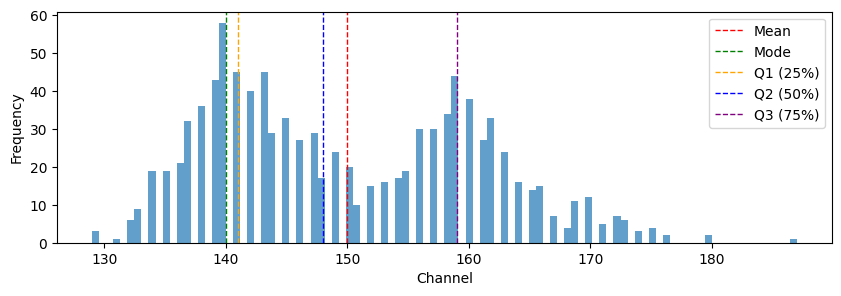

In [6]:
# Test data
plot_channel_distribution(test_df[c_channel])

<font color="green"><h1>Baseline (The highest value)</h1></font>

In [7]:
# Baseline
bl = test_df[c_channel].max()
baseline = test_df[round(test_df[c_channel]) == bl].sample(n=1, random_state=12)
baseline

,Unnamed: 0.1,Unnamed: 0,lesion_id,image_id,dx,dx_type,age,sex,localization,filepaths,cell_type,labels,ita,fts,predictions,A
142,2458,2458,HAM_0004413,ISIC_0026068,vasc,consensus,55.0,female,abdomen,d:/ham/ham/HAM10000_images_part_1/ISIC_0026068...,Vascular lesions,5,82.518194,1,5,187.0


## Baseline color

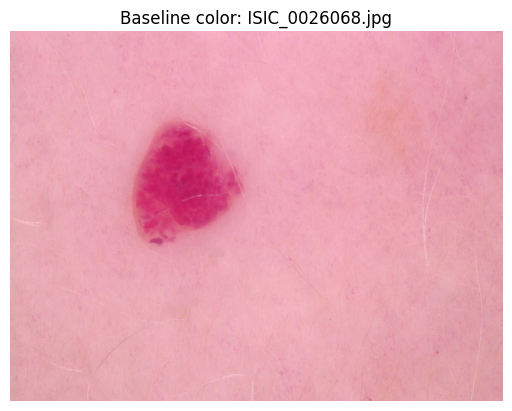

In [8]:
for s in baseline["filepaths"]:
    img = cv2.imread(s)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Baseline color: " + str(s).split("/")[-1])
    plt.axis("off")
    plt.show()

## Picking up one of images with the same average values

In [9]:
bl

187.0

In [10]:
samples_df = baseline.copy()

# Just starts from i = 1
for i in range(1, int(bl), 1):
    tmp = test_df[test_df[c_channel] == (bl - i)]
    if len(tmp) > 0:
        tmp = tmp.sample(n=1, random_state=12)
        samples_df = pd.concat([samples_df, tmp], axis=0)

In [11]:
samples_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49 entries, 142 to 81
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  49 non-null     int64  
 1   Unnamed: 0    49 non-null     int64  
 2   lesion_id     49 non-null     object 
 3   image_id      49 non-null     object 
 4   dx            49 non-null     object 
 5   dx_type       49 non-null     object 
 6   age           49 non-null     float64
 7   sex           49 non-null     object 
 8   localization  49 non-null     object 
 9   filepaths     49 non-null     object 
 10  cell_type     49 non-null     object 
 11  labels        49 non-null     int64  
 12  ita           49 non-null     float64
 13  fts           49 non-null     int64  
 14  predictions   49 non-null     int64  
 15  A             49 non-null     float64
dtypes: float64(3), int64(5), object(8)
memory usage: 6.5+ KB


## Selected images

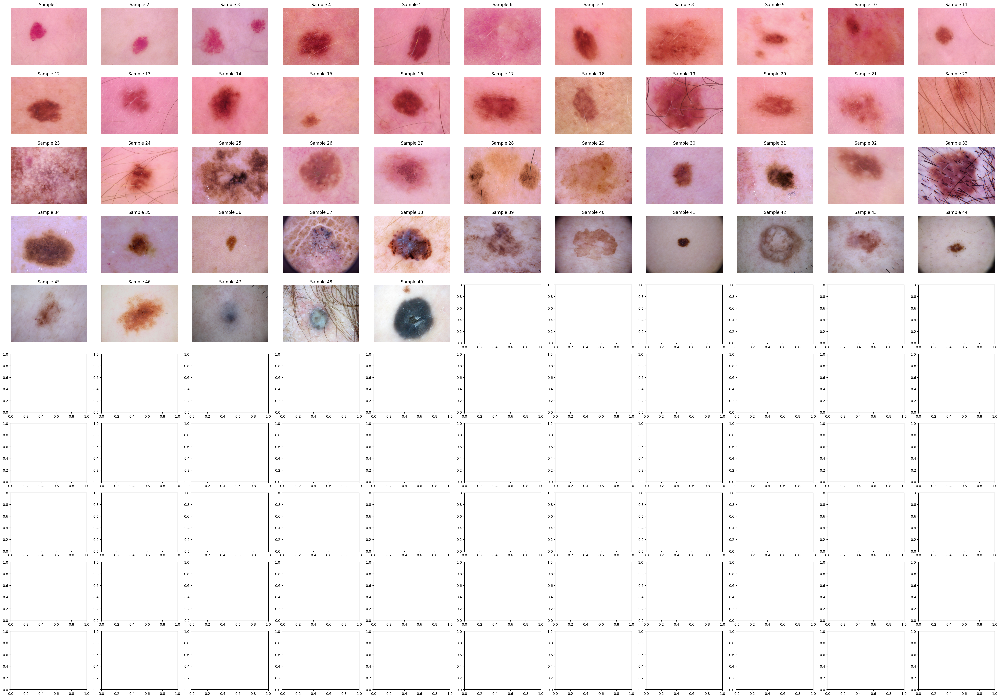

In [12]:
plot_sample_images(samples_df.sort_values(by=c_channel, ascending=False)["filepaths"], col=10, row=11)

## Calculate distance from baseline

In [13]:
color_space_mappings = {
    "RGB": cv2.COLOR_BGR2RGB, "HSV": cv2.COLOR_BGR2HSV, "LAB": cv2.COLOR_BGR2LAB, "YCrCb": cv2.COLOR_BGR2YCrCb}

In [14]:
# Baseline color distribution
base_channels = extract_skin_pixels(baseline["filepaths"].values[0])

In [15]:
# Wasserstein distance
w_distances = []
for s in test_df["filepaths"]:
    c = extract_skin_pixels(s)
    w_dis = Wasserstein_Dist(base_channels, c)
    w_distances.append(w_dis)
test_df["wasserstein"] = w_distances

In [16]:
# Kuiper_Dist
distances = []
for s in test_df["filepaths"]:
    c = extract_skin_pixels(s)
    dis = Kuiper_Dist(base_channels, c)
    distances.append(dis)
test_df["kuiper"] = distances

In [17]:
# Anderson_Darling_Dist
distances = []
for s in test_df["filepaths"]:
    c = extract_skin_pixels(s)
    dis = Anderson_Darling_Dist(base_channels, c)
    distances.append(dis)
test_df["anderson"] = distances

In [18]:
# Cramer-Von Mises Distance
distances = []
for s in test_df["filepaths"]:
    c = extract_skin_pixels(s)
    dis = CVM_Dist(base_channels, c)
    distances.append(dis)
test_df["cvm"] = distances

In [19]:
# Kolmogorov_Smirnov_Dist
distances = []
for s in test_df["filepaths"]:
    c = extract_skin_pixels(s)
    dis = Kolmogorov_Smirnov_Dist(base_channels, c)
    distances.append(dis)
test_df["kolmogorov"] = distances

## Display color distribution distances

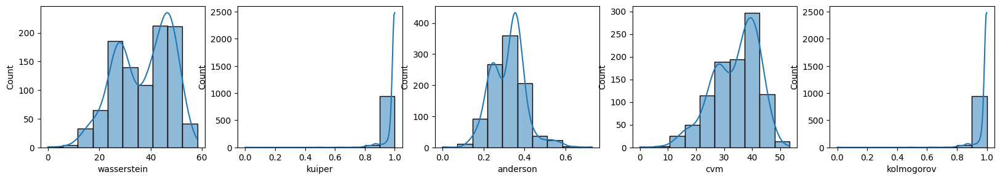

In [20]:
fig, axes = plt.subplots(1, 5, figsize=(20, 3))
sns.histplot(test_df["wasserstein"].sort_values(), bins=10, kde=True, ax=axes[0])
sns.histplot(test_df["kuiper"].sort_values(), bins=10, kde=True, ax=axes[1])
sns.histplot(test_df["anderson"].sort_values(), bins=10, kde=True, ax=axes[2])
sns.histplot(test_df["cvm"].sort_values(), bins=10, kde=True, ax=axes[3])
sns.histplot(test_df["kolmogorov"].sort_values(), bins=10, kde=True, ax=axes[4])
plt.show()

## Calculate performance distance

In [21]:
test_df.sort_values(by=c_channel, ascending=False)

,Unnamed: 0.1,Unnamed: 0,lesion_id,image_id,dx,dx_type,age,sex,localization,filepaths,...,labels,ita,fts,predictions,A,wasserstein,kuiper,anderson,cvm,kolmogorov
142,2458,2458,HAM_0004413,ISIC_0026068,vasc,consensus,55.0,female,abdomen,d:/ham/ham/HAM10000_images_part_1/ISIC_0026068...,...,5,82.518194,1,5,187.0,0.000000,0.000000,0.000000,0.000000,0.000000
833,2408,2408,HAM_0006406,ISIC_0026336,vasc,consensus,50.0,male,trunk,d:/ham/ham/HAM10000_images_part_1/ISIC_0026336...,...,5,83.876911,1,5,180.0,7.070871,0.489935,0.118130,7.070871,0.489935
969,2428,2428,HAM_0005011,ISIC_0026393,vasc,consensus,80.0,male,trunk,d:/ham/ham/HAM10000_images_part_1/ISIC_0026393...,...,5,64.791797,1,5,180.0,7.218523,0.656321,0.117023,7.218297,0.656246
153,2419,2419,HAM_0000845,ISIC_0025244,vasc,consensus,45.0,female,trunk,d:/ham/ham/HAM10000_images_part_1/ISIC_0025244...,...,5,103.399862,1,5,176.0,11.213738,0.621466,0.128084,11.213738,0.621466
191,4123,4123,HAM_0007388,ISIC_0031693,nv,follow_up,75.0,male,trunk,d:/ham/ham/HAM10000_images_part_2/ISIC_0031693...,...,0,44.675570,2,0,176.0,10.895761,0.791193,0.132619,10.895761,0.791193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216,9079,9079,HAM_0001126,ISIC_0025123,nv,histo,20.0,female,back,d:/ham/ham/HAM10000_images_part_1/ISIC_0025123...,...,0,88.900633,1,0,132.0,55.182495,1.000000,0.345092,38.183028,1.000000
748,7706,7706,HAM_0002135,ISIC_0032974,nv,histo,50.0,male,scalp,d:/ham/ham/HAM10000_images_part_2/ISIC_0032974...,...,0,90.796523,1,0,131.0,55.993733,1.000000,0.417735,46.994262,1.000000
128,7410,7410,HAM_0007005,ISIC_0032568,nv,histo,40.0,female,acral,d:/ham/ham/HAM10000_images_part_2/ISIC_0032568...,...,0,67.258394,1,0,129.0,57.788738,1.000000,0.485869,46.794962,1.000000
81,7712,7712,HAM_0003676,ISIC_0032530,nv,histo,25.0,female,lower extremity,d:/ham/ham/HAM10000_images_part_2/ISIC_0032530...,...,0,89.385174,1,0,129.0,58.196356,1.000000,0.422359,46.196884,1.000000


In [22]:
# True Positive
def true_positive(data, label):
    l = len(data[(data["labels"] == label) & (data["predictions"] == label)])
    return l

In [23]:
# False Positive
def false_positive(data, label):
    l = len(data[(data["labels"] != label) & (data["predictions"] == label)])
    return l

In [24]:
# False Negative
def false_negative(data, label):
    l = len(data[(data["labels"] == label) & (data["predictions"] != label)])
    return l

In [25]:
# True Negative
def true_negative(data, label):
    l = len(data[(data["labels"] != label) & (data["predictions"] != label)])
    return l

In [26]:
label = 0
data = test_df
tp = true_positive(data, label)
fp = false_positive(data, label)
fn = false_negative(data, label)
tn = true_negative(data, label)
g_accuracy = round((tp + tn) / (tp + tn+ fp + fn), 4)
g_precision = round(tp / (tp + fp), 4)
g_recall = round(tp / (tp + fn), 4)

print("Grand Accuracy: {}".format(g_accuracy))
print("Grand Precision: {}".format(g_precision))
print("Grand Recall: {}".format(g_recall))

Grand Accuracy: 0.8812
Grand Precision: 0.9662
Grand Recall: 0.8525


In [27]:
def plot_performance_vs_channel(label):
    
    acc = []
    pre = []
    rec = []
    
    for v in list(samples_df[c_channel]):
        data = test_df[test_df[c_channel] == v]
        tp = true_positive(data, label)
        fp = false_positive(data, label)
        fn = false_negative(data, label)
        tn = true_negative(data, label)
        a = round((tp + tn) / (tp + tn+ fp + fn), 4)
        acc.append(a)
        if tp + fp != 0:
            p = round(tp / (tp + fp), 4)
        else:
            p = 0
        pre.append(p)
        if tp + fn != 0:
            r = round(tp / (tp + fn), 4)
        else:
            r = 0
        rec.append(r)
        
    c_channels = list(samples_df[c_channel])
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 3))
    axes[0].scatter(c_channels, acc, alpha=0.3, color="blue")
    axes[0].set_ylabel("Class{} Accuracy".format(label))
    axes[0].set_xlabel("{}-Channels".format(c_channel))
    axes[1].scatter(c_channels, pre, alpha=0.3, color="orange")
    axes[1].set_ylabel("Class{} Precision".format(label))
    axes[1].set_xlabel("{}-Channels".format(c_channel))
    axes[2].scatter(c_channels, rec, alpha=0.3, color="green")
    axes[2].set_ylabel("Class{} Recall".format(label))
    axes[2].set_xlabel("{}-Channels".format(c_channel))
    plt.tight_layout()
    plt.show()

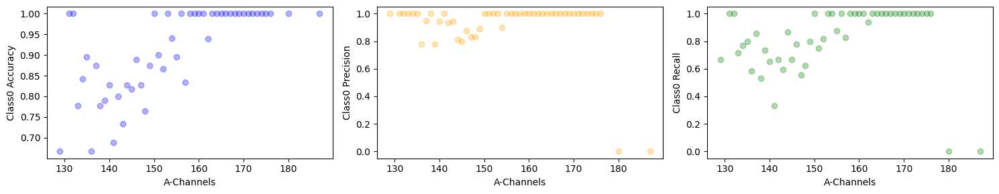

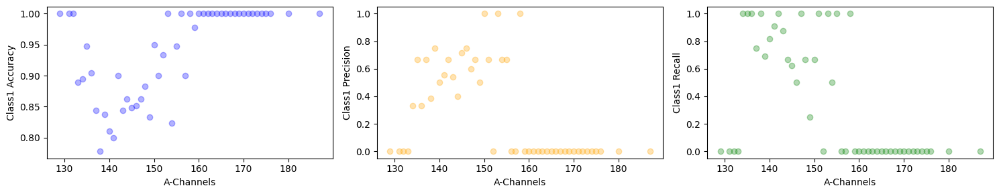

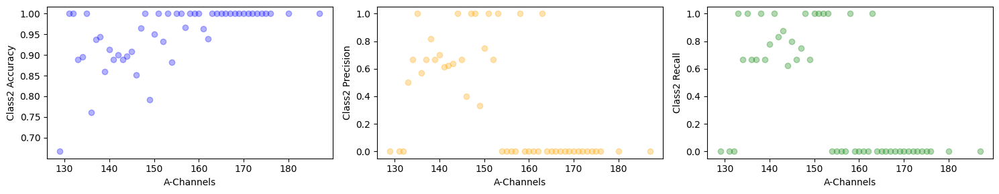

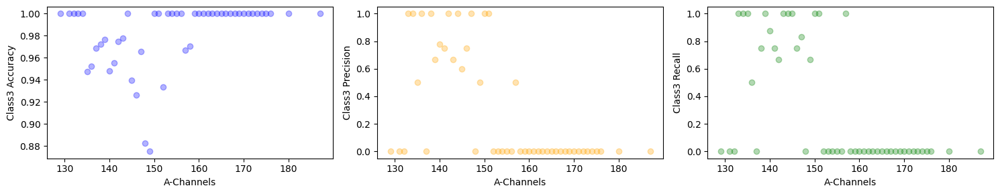

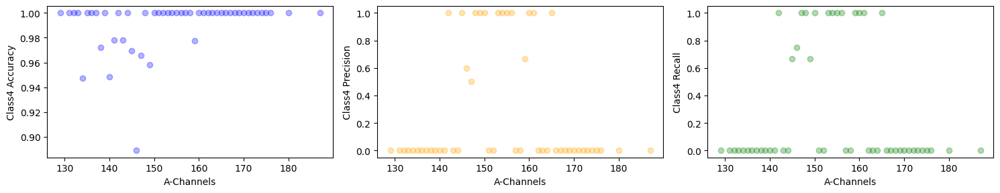

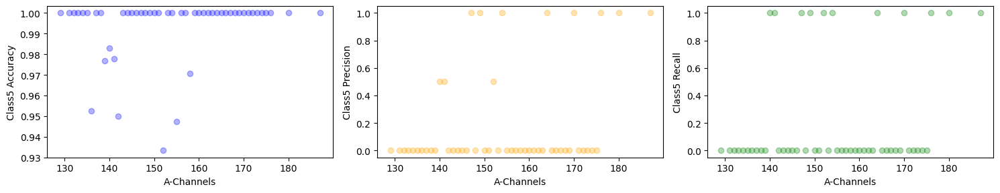

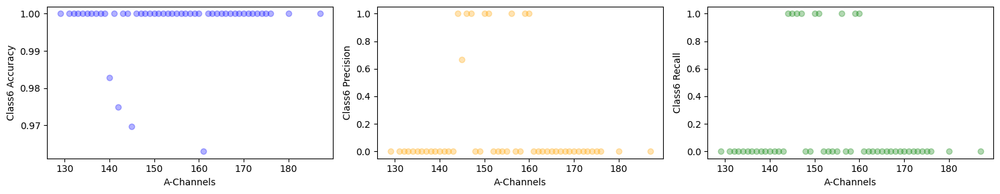

In [28]:
for l in range(7):
    plot_performance_vs_channel(l)

## Calculate cumulative performance distance

In [29]:
def plot_cumulative_performance_vs_channel_distance(label, m_distance):
    acc = []
    pre = []
    rec = []
    
    for v in test_df[m_distance]:
        data = test_df[test_df[m_distance] <= v]
        tp = true_positive(data, label)
        fp = false_positive(data, label)
        fn = false_negative(data, label)
        tn = true_negative(data, label)
        a = round((tp + tn) / (tp + tn+ fp + fn), 4)
        acc.append(a)
        if tp + fp != 0:
            p = round(tp / (tp + fp), 4)
        else:
            p = 0
        pre.append(p)
        if tp + fn != 0:
            r = round(tp / (tp + fn), 4)
        else:
            r = 0
        rec.append(r)

    dis = test_df[m_distance]
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 3))
    axes[0].scatter(dis, acc, alpha=0.3, color="blue")
    axes[0].set_ylabel("Class{} Accuracy".format(label))
    axes[0].set_xlabel("{}-channel distribusion ({})".format(c_channel, m_distance))
    axes[1].scatter(dis, pre, alpha=0.3, color="orange")
    axes[1].set_ylabel("Class{} Precision".format(label))
    axes[1].set_xlabel("{}-channel distribusion ({})".format(c_channel, m_distance))
    axes[2].scatter(dis, rec, alpha=0.3, color="green")
    axes[2].set_ylabel("Class{} Recall".format(label))
    axes[2].set_xlabel("{}-channel distribusion ({})".format(c_channel, m_distance))
    plt.tight_layout()
    plt.show()

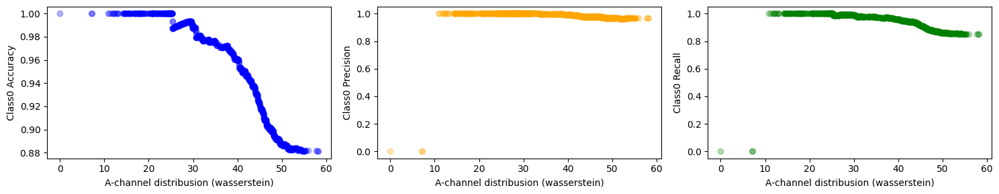

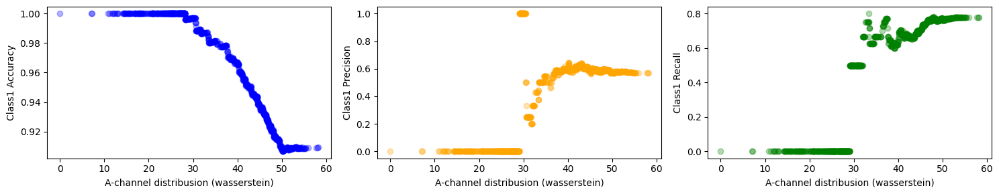

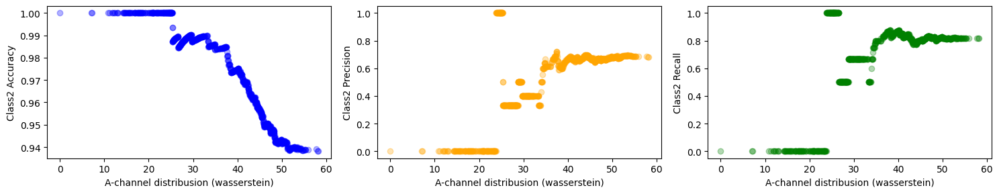

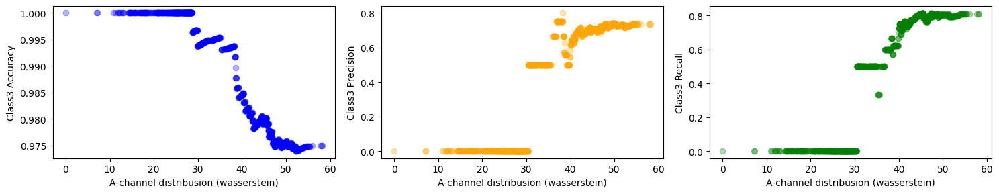

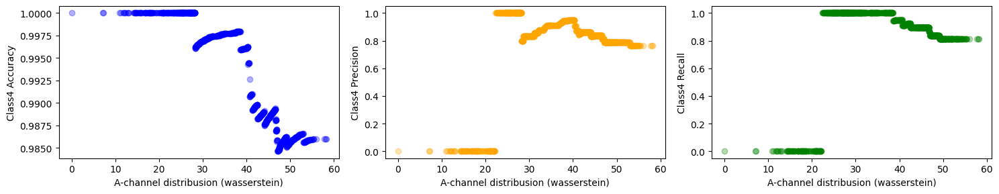

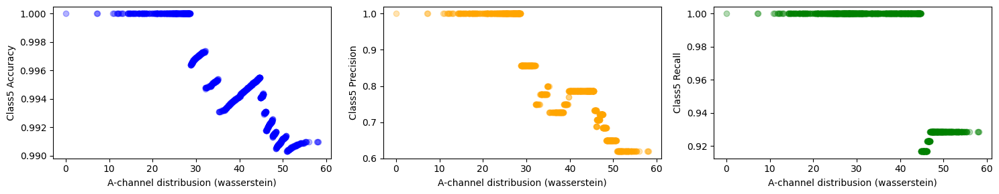

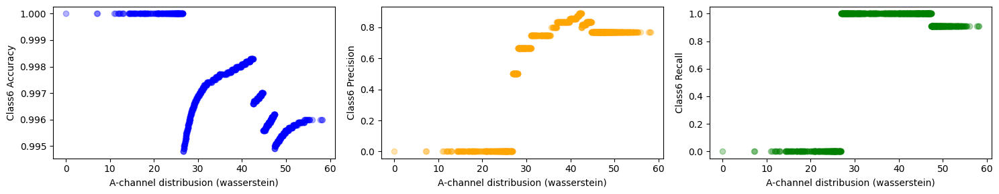

In [30]:
for l in range(7):
    plot_cumulative_performance_vs_channel_distance(l, "wasserstein")

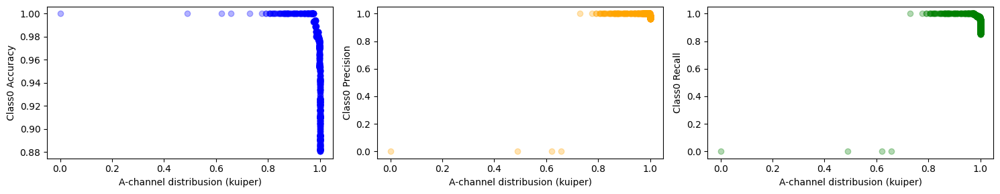

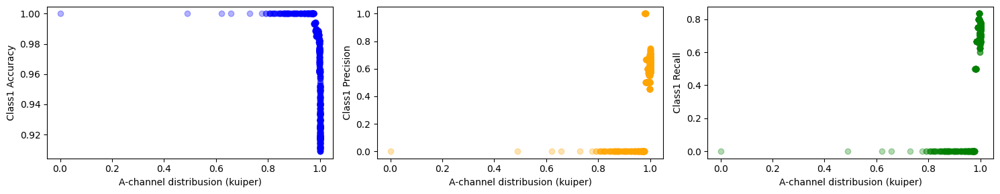

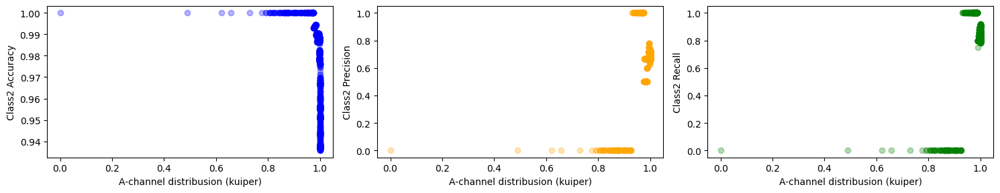

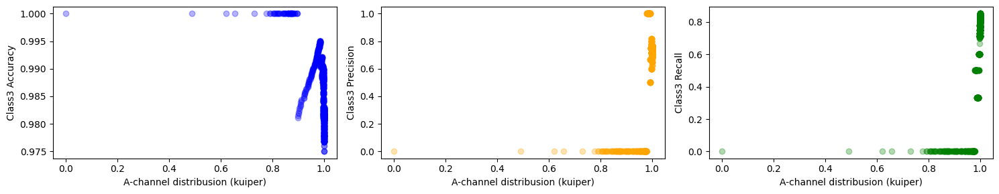

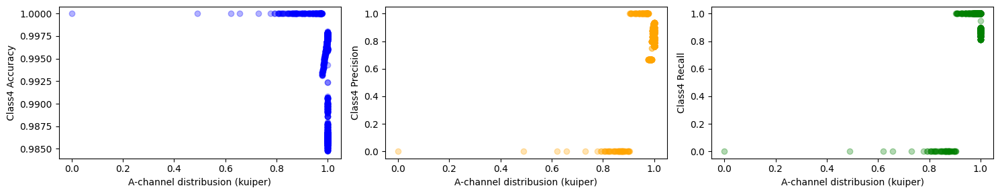

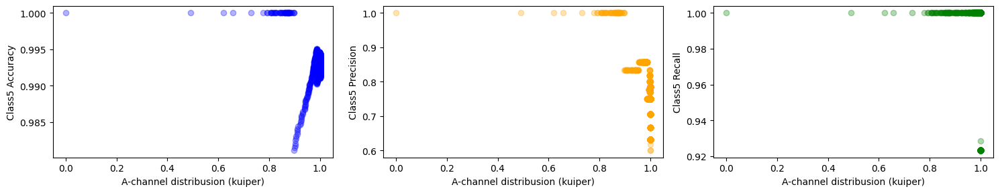

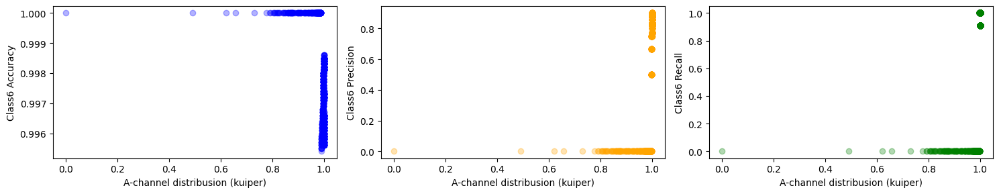

In [31]:
for l in range(7):
    plot_cumulative_performance_vs_channel_distance(l, "kuiper")

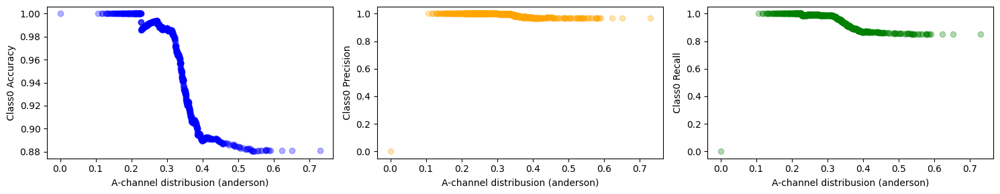

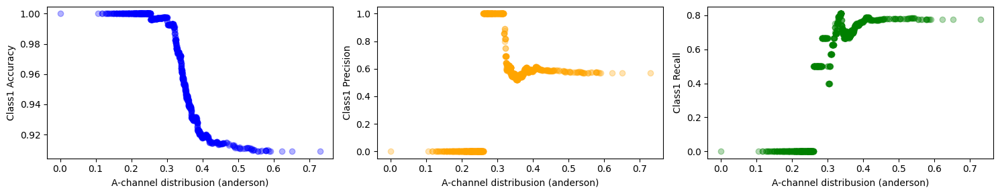

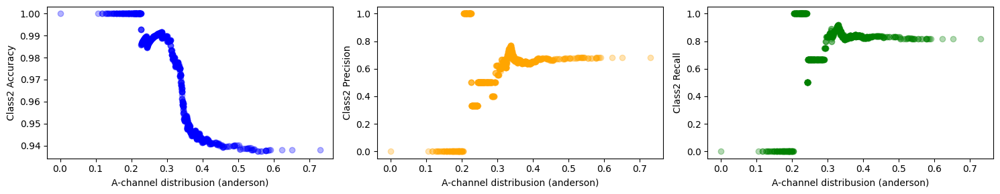

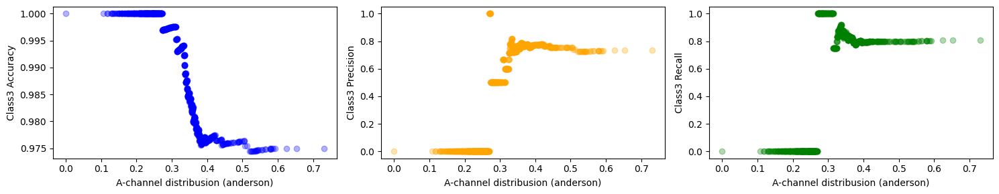

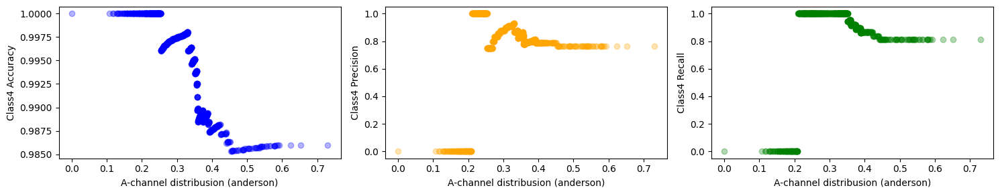

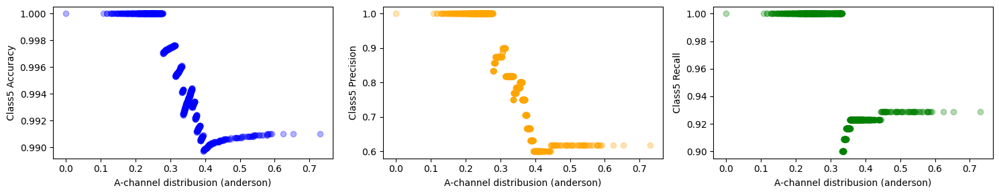

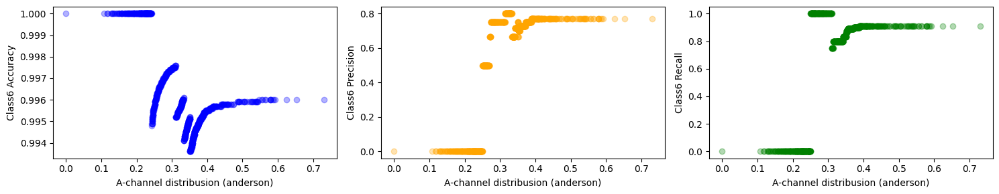

In [32]:
for l in range(7):
    plot_cumulative_performance_vs_channel_distance(l, "anderson")

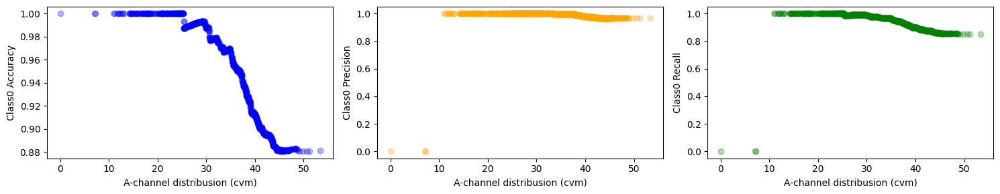

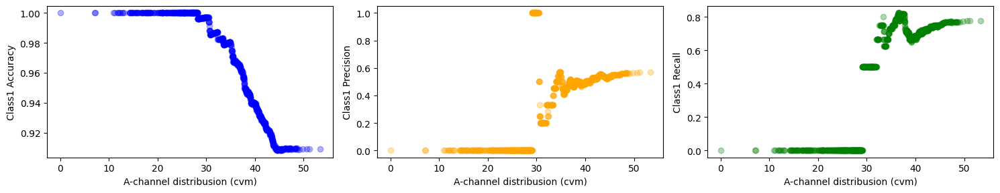

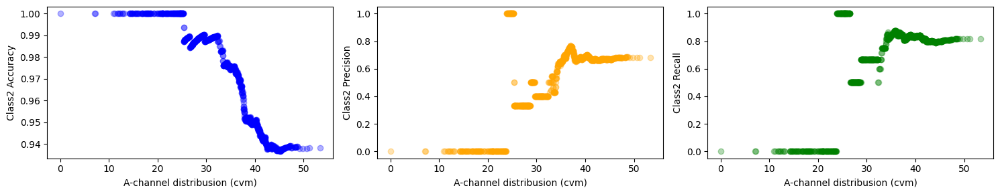

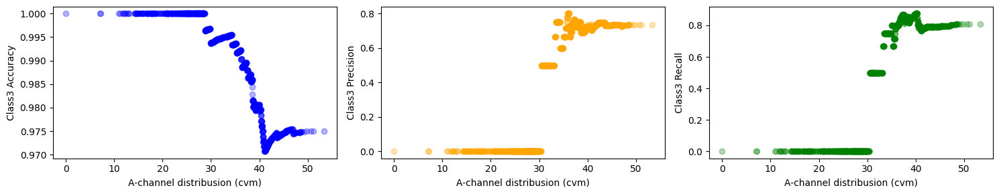

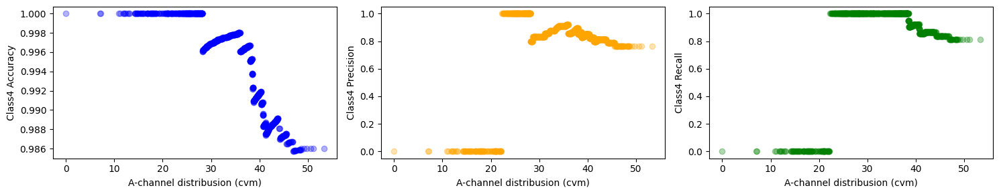

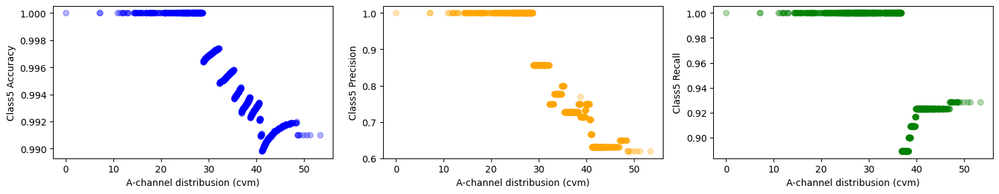

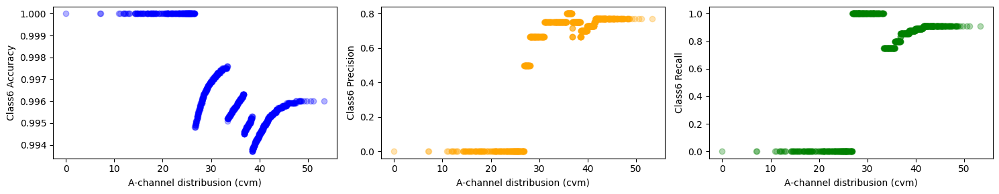

In [33]:
for l in range(7):
    plot_cumulative_performance_vs_channel_distance(l, "cvm")

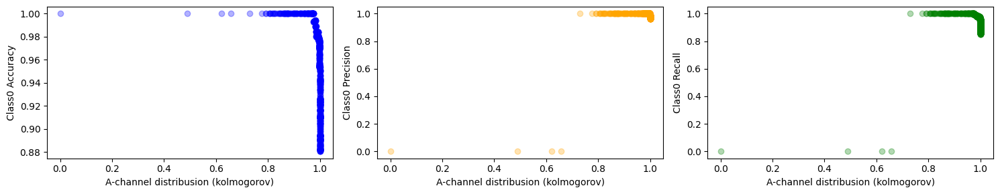

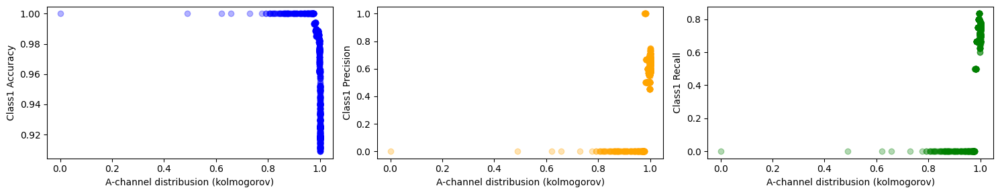

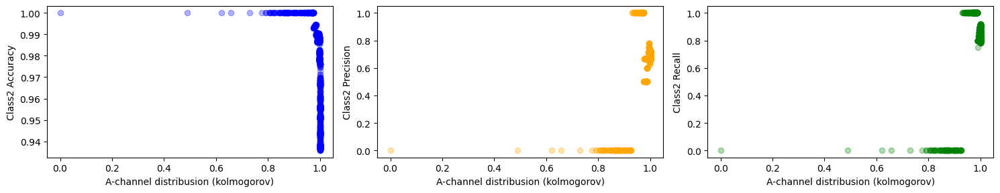

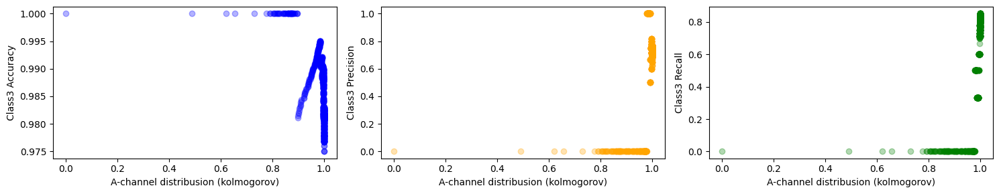

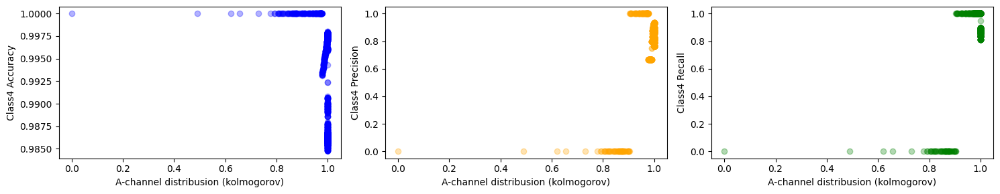

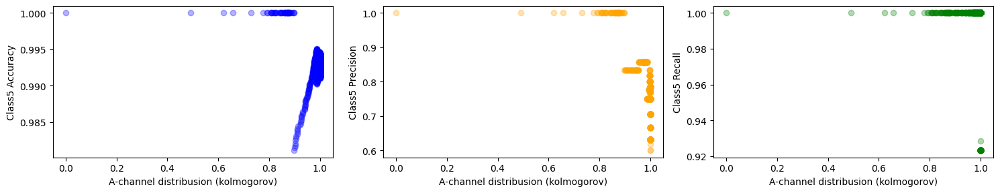

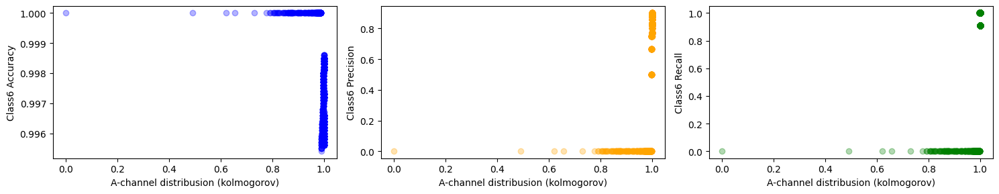

In [34]:
for l in range(7):
    plot_cumulative_performance_vs_channel_distance(l, "kolmogorov")

## Calculate cumulative performance gap distance

In [35]:
def plot_performance_gap_vs_channel_distance(label, m_distance):

    b_data = test_df[test_df[m_distance] == 0]

    b_tp = true_positive(b_data, label)
    b_fp = false_positive(b_data, label)
    b_fn = false_negative(b_data, label)
    b_tn = true_negative(b_data, label)
    b_acc = round((b_tp + b_tn) / (b_tp + b_tn+ b_fp + b_fn), 4)
    if b_tp + b_fp != 0:
        b_pre = round(b_tp / (b_tp + b_fp), 4)
    else:
        b_pre = 0
    if b_tp + b_fn != 0:
        b_rec = round(b_tp / (b_tp + b_fn), 4)
    else:
        b_rec = 0

    acc = []
    pre = []
    rec = []
    
    for v in test_df[m_distance]:
        data = test_df[test_df[m_distance] <= v]
        
        tp = true_positive(data, label)
        fp = false_positive(data, label)
        fn = false_negative(data, label)
        tn = true_negative(data, label)
        
        a = round((tp + tn) / (tp + tn+ fp + fn), 4)
        acc.append(b_acc - a)
        if tp + fp != 0:
            p = round(tp / (tp + fp), 4)
        else:
            p = 0
        pre.append(b_pre - p)
        if tp + fn != 0:
            r = round(tp / (tp + fn), 4)
        else:
            r = 0
        rec.append(b_rec - r)

    dis = test_df[m_distance]

    fig, axes = plt.subplots(1, 3, figsize=(15, 3))
    axes[0].scatter(dis, acc, alpha=0.3, color="blue")
    axes[0].set_ylabel("Accuracy Gap")
    axes[0].set_xlabel("{}-channel distribusion ({})".format(c_channel, m_distance))
    axes[1].scatter(dis, pre, alpha=0.3, color="orange")
    axes[1].set_ylabel("Presicion Gap")
    axes[1].set_xlabel("{}-channel distribusion ({})".format(c_channel, m_distance))
    axes[2].scatter(dis, rec, alpha=0.3, color="green")
    axes[2].set_ylabel("Recall Gap")
    axes[2].set_xlabel("{}-channel distribusion ({})".format(c_channel, m_distance))
    plt.tight_layout()
    plt.show()

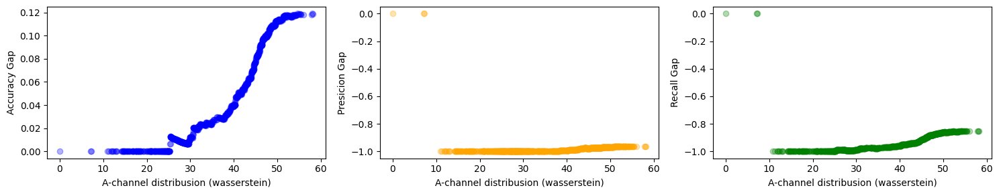

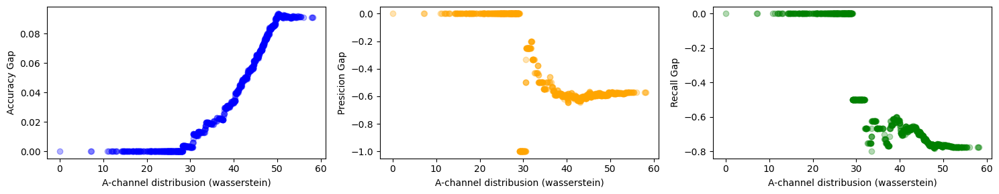

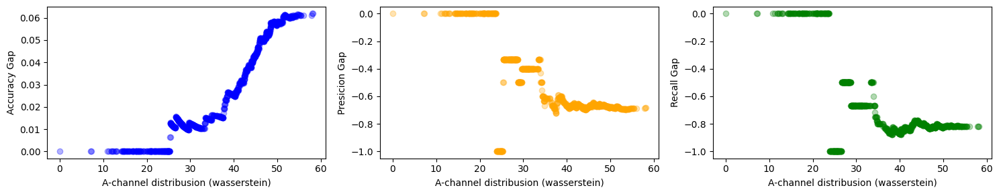

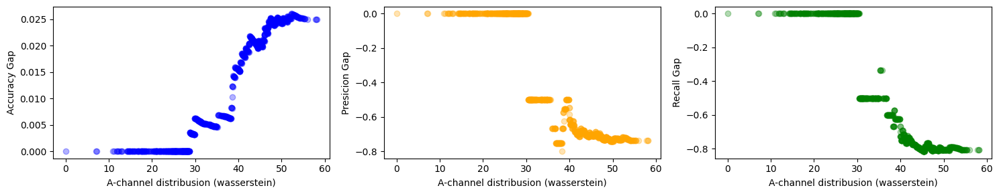

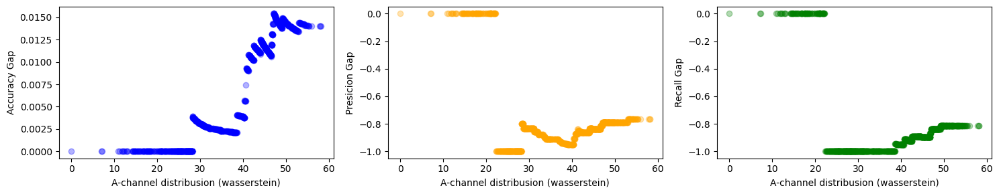

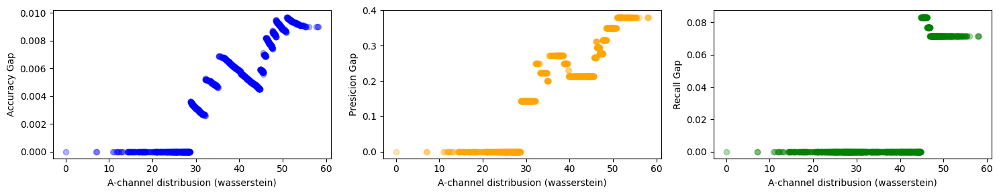

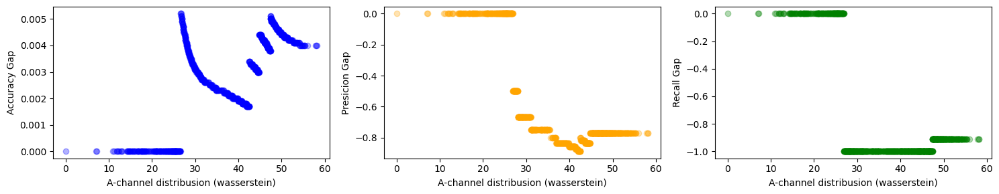

In [36]:
for l in range(7):
    plot_performance_gap_vs_channel_distance(l, "wasserstein")

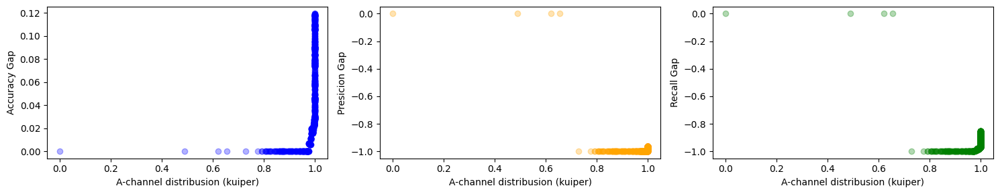

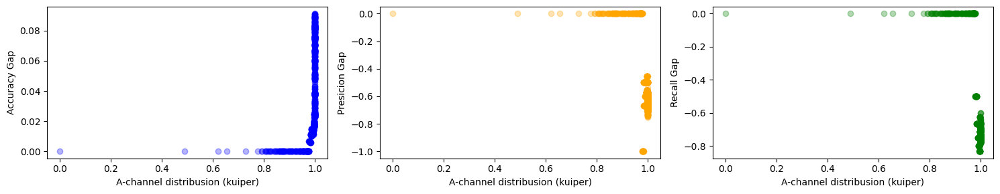

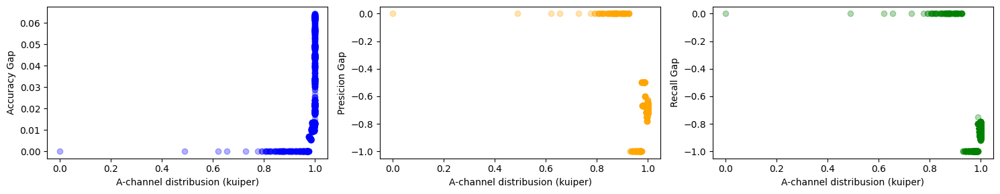

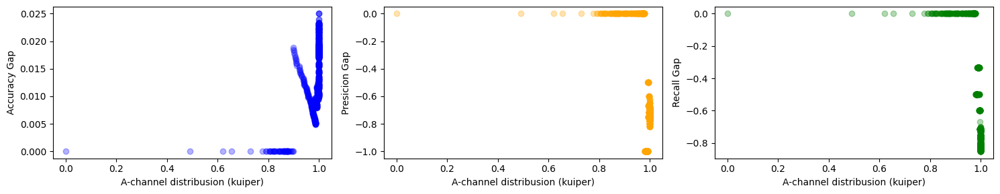

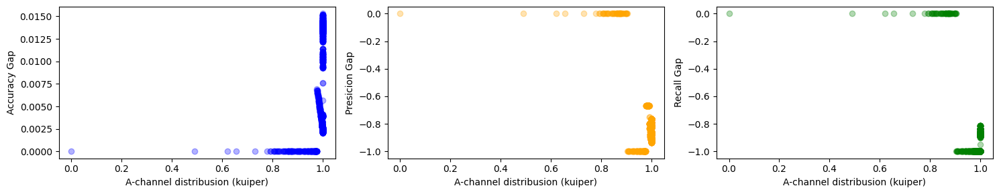

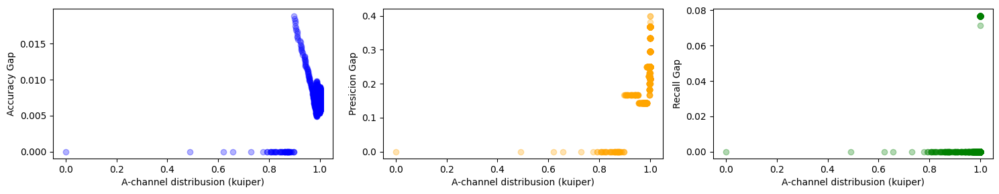

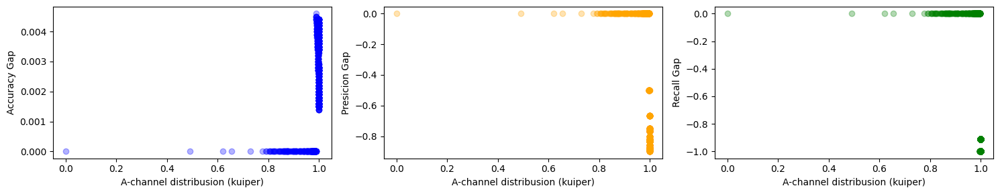

In [37]:
for l in range(7):
    plot_performance_gap_vs_channel_distance(l, "kuiper")

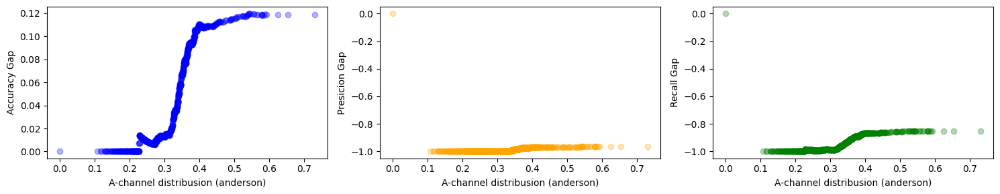

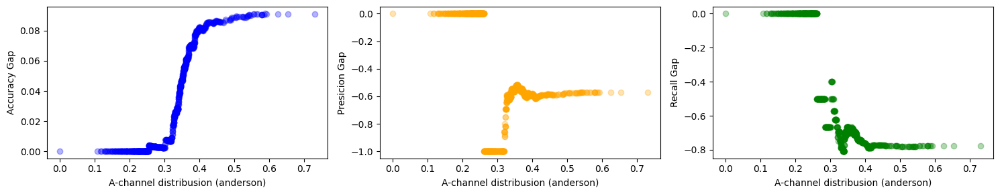

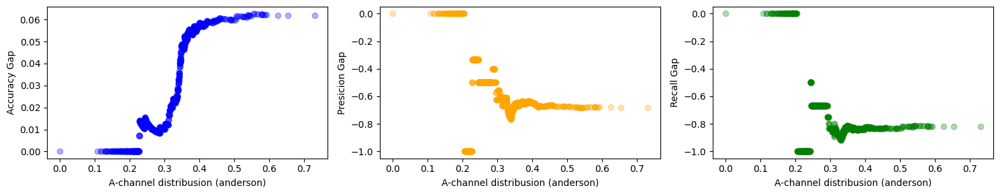

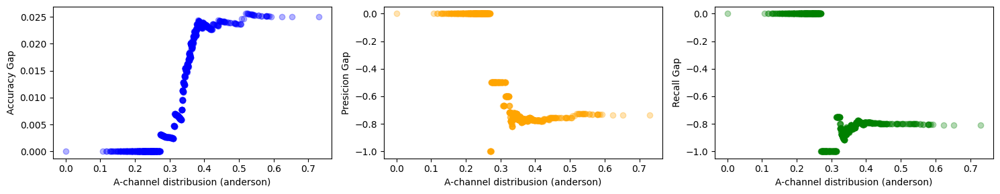

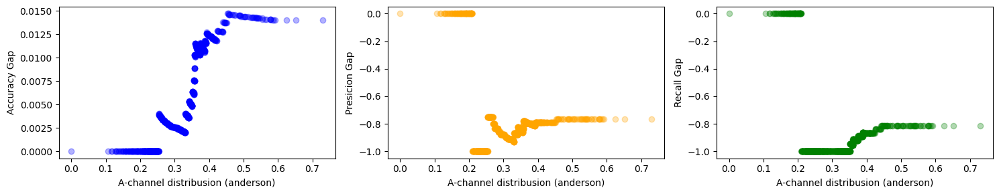

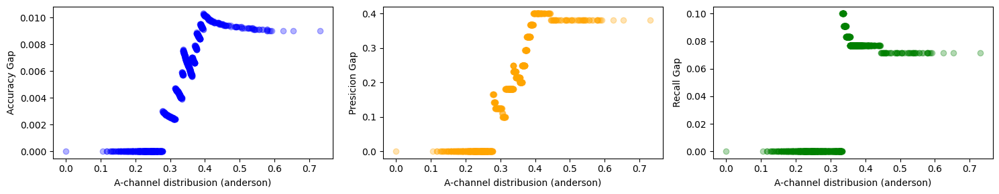

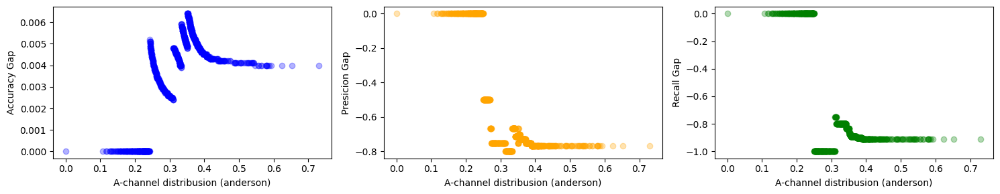

In [38]:
for l in range(7):
    plot_performance_gap_vs_channel_distance(l, "anderson")

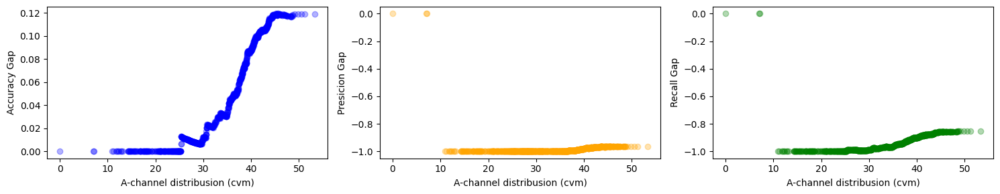

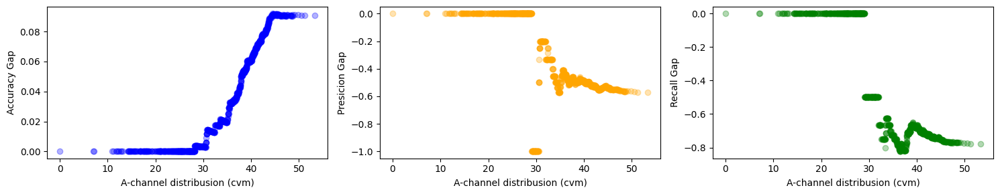

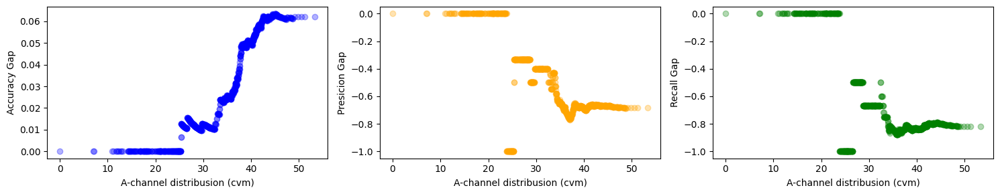

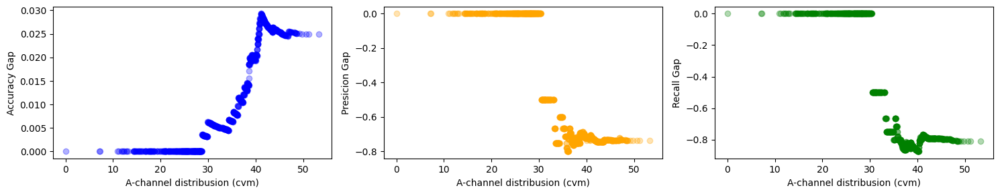

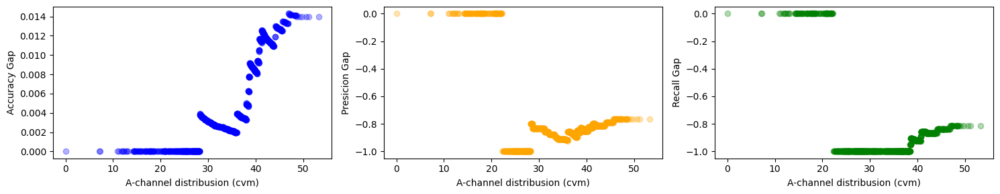

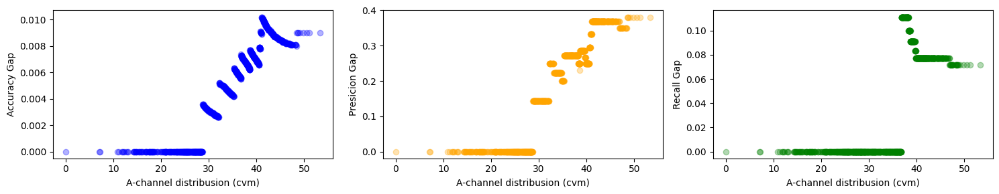

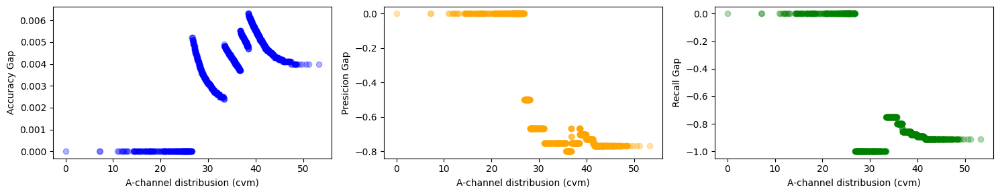

In [39]:
for l in range(7):
    plot_performance_gap_vs_channel_distance(l, "cvm")

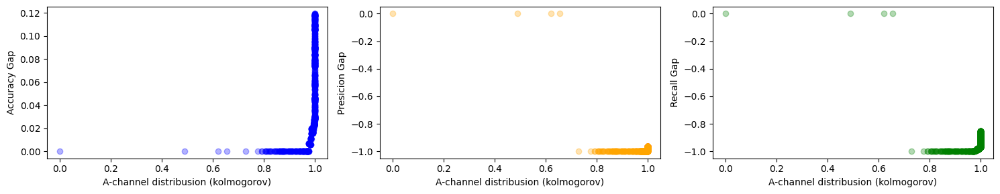

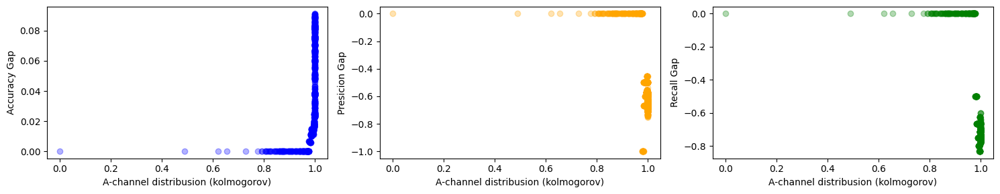

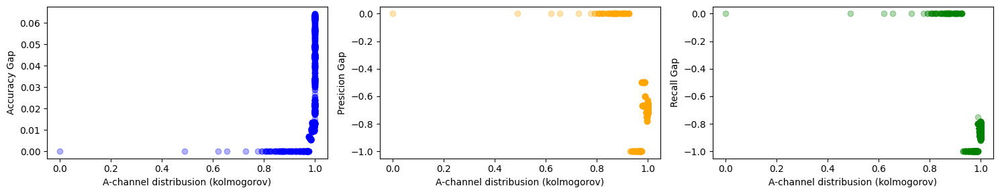

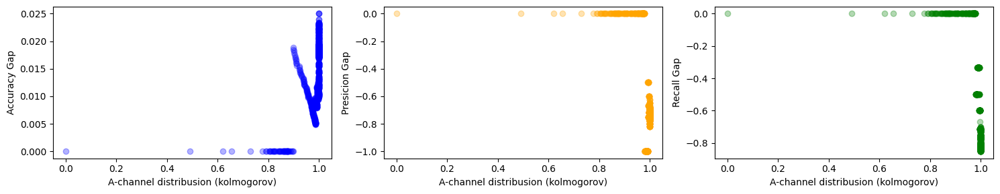

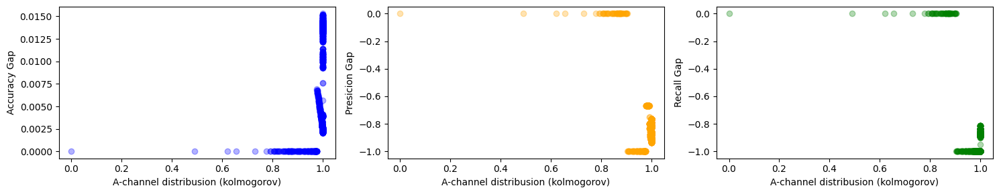

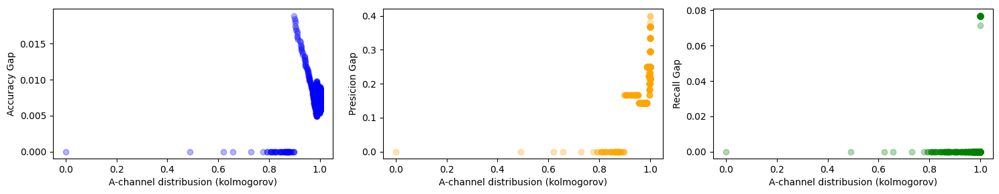

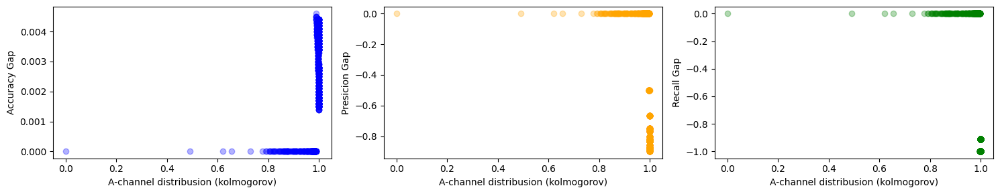

In [40]:
for l in range(7):
    plot_performance_gap_vs_channel_distance(l, "kolmogorov")